# 0. Solution Planning

## 0.1. Input

1. Business Problem
    - Select most valuable clientsto be part of a loyalty program

2. Dataset
    - Sales from an e-commerce during one year

## 0.2. Output

1. People indication to be part of the loyalty program
    - List of clients tagged

2. Report with the business questions

    - Who are the elegible people to participate in the loyalty program?
    - How many clients will be part of the loyalty program?
    - Which are the main client characteristics?
    - What is the percentage of profit contribution that comes from the loyalty program?
    - What is the profit expectation from this group in the next months?
    - What are the conditions that makes someone elegible to the loyalty program?
    - What are the conditions that makes someone not elegible anymore to the loyalty program?
    - What are the metrics to decide if the loyalty program people are really better than the rest of the database?
    - What could the marketing team do to improve the profit?

## 0.3. Tasks

Who are the elegible people to participate in the loyalty program?
- High average ticket;
- High LTV (Life Time Value);
- High purchase frequency;
- High basket size;
- Low churn probability;
- High purchase propensity.
- Low number of devolutions;
- Experience;
- High number of ratings.

How many clients will be part of the loyalty program?
- Percentage of total clients.

What are the main client characteristics?
- Important client attributes (age, country, salary);
- Client purchasing behavior.

What is the percentage of profit contribution that comes from the loyalty program?
- Get the total profit of the company during the year and the percentage of the cluster.

What is the profit expectation from this group in the next months?
- Get the loyalty program LTV;
- Build a time series.

What are the conditions that make someone elegible to the loyalty program?
- The average performance of the client is close to the average performance of the clients from the loyalty program.

What are the conditions that make someone not elegible anymore to the loyalty program?
- The client average performance is not close to the loyalty program average anymore.

What are the metrics to decide if the loyalty program people are really better than the rest of the database?
- Hypothesis testing;
- A/B testing.

What could the marketing team do to improve the profit?
- Discounts;
- Choosing preferences;
- Exclusive products.

# 1. Imports

In [57]:
import numpy as np
import regex as re
import pandas as pd
import seaborn as sns
import umap.umap_ as umap

from sklearn import metrics
from quickda import explore_data
from IPython.display import HTML
from sklearn.manifold import TSNE
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

from plotly import express as px
from sklearn import cluster as c
from sklearn import ensemble as en
from sklearn import preprocessing as pp
from sklearn import decomposition as dd
from matplotlib import pyplot as plt

## 1.1. Helper Functions

In [3]:
def settings():

    %matplotlib inline
    plt.style.use('ggplot')
    plt.rcParams['figure.figsize'] = [10, 5]
    plt.rcParams['font.size'] = 24

    display(HTML('<style>.container { width:100% !important; }</style>'))

    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option('display.float_format', lambda x: '%.4f' % x)
    pd.set_option('display.expand_frame_repr', False)

    sns.set()

settings()

## 1.2. Load Dataset

In [4]:
df_raw = pd.read_csv('../data/Ecommerce.csv', encoding='unicode_escape')

df_raw.drop(columns=['Unnamed: 8'], inplace=True)

In [5]:
df_raw.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.5500,17850.0000,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.3900,17850.0000,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.7500,17850.0000,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.3900,17850.0000,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.3900,17850.0000,United Kingdom


# 2. Data Description

In [6]:
df1 = df_raw.copy()

## 2.1. Rename Columns

In [7]:
cols_new = ['invoice_no', 'stock_code', 'description', 'quantity', 'invoice_date', 'unit_price', 'customer_id', 'country']

df1.columns = cols_new

## 2.2. Data Dimension

In [8]:
print('Number of Rows: {}'.format(df1.shape[0]))
print('Number of Cols: {}'.format(df1.shape[1]))

Number of Rows: 541909
Number of Cols: 8


## 2.3. Check NA

In [9]:
df1.isna().sum()

invoice_no           0
stock_code           0
description       1454
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
dtype: int64

## 2.4. Replace NA

In [10]:
df_missing = df1.loc[df1['customer_id'].isna(), :]
df_not_missing = df1.loc[~df1['customer_id'].isna(), :]

In [11]:
# create reference
df_backup = pd.DataFrame(df_missing['invoice_no'].drop_duplicates())
df_backup['customer_id'] = np.arange(19000, 19000+len(df_backup), 1)

# merge original with reference dataframe
df1 = pd.merge(df1, df_backup, on='invoice_no', how='left')

# coalesce 
df1['customer_id'] = df1['customer_id_x'].combine_first( df1['customer_id_y'])

# drop extra columns
df1 = df1.drop(columns=['customer_id_x', 'customer_id_y'], axis=1)

In [12]:
df1.isna().sum()

invoice_no         0
stock_code         0
description     1454
quantity           0
invoice_date       0
unit_price         0
country            0
customer_id        0
dtype: int64

## 2.6. Check Data Types

In [13]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
country          object
customer_id     float64
dtype: object

## 2.4. Change Data Types

In [14]:
# invoice_date
df1['invoice_date'] = pd.to_datetime(df1['invoice_date'], format='%d-%b-%y')

# customer_id
df1['customer_id'] = df1['customer_id'].astype(int)

In [15]:
df1.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
country                 object
customer_id              int64
dtype: object

## 2.7. Descriptive Statistics

In [16]:
num_attributes = df1.select_dtypes(include=['int64', 'int32', 'float64'])
cat_attributes = df1.select_dtypes(exclude=['int64', 'float64', 'datetime64[ns]'])

### 2.7.1. Numerical Attributes

In [17]:
num_attributes.head()

,quantity,unit_price,customer_id
0,6,2.5500,17850
1,6,3.3900,17850
2,8,2.7500,17850
3,6,3.3900,17850
4,6,3.3900,17850


In [18]:
# Central Tendency: mean, median
ct1 = pd.DataFrame(num_attributes.apply(np.mean)).T
ct2 = pd.DataFrame(num_attributes.apply(np.median)).T

# Dispersion: std, min, max, range, skew, kurtosis
d1 = pd.DataFrame(num_attributes.apply(np.std)).T
d2 = pd.DataFrame(num_attributes.apply(min)).T
d3 = pd.DataFrame(num_attributes.apply(max)).T
d4 = pd.DataFrame(num_attributes.apply(lambda x: x.max() - x.min())).T
d5 = pd.DataFrame(num_attributes.apply(lambda x: x.skew())).T
d6 = pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis())).T

# concatenate
m = pd.concat([d2, d3, d4, ct1, ct2, d1, d5, d6]).T.reset_index()
m.columns = ['attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']
m

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,quantity,-80995.0000,80995.0000,161990.0000,9.5522,3.0000,218.0810,-0.2641,119769.1600
1,unit_price,-11062.0600,38970.0000,50032.0600,4.6111,2.0800,96.7598,186.5070,59005.7191
2,customer_id,12346.0000,22709.0000,10363.0000,16688.8405,16249.0000,2911.4087,0.4874,-0.8043


1. Quantity with negative value;

2. Unit price equal to zero.

### 2.7.2. Categorical Attributes

In [19]:
cat_attributes.head()

,invoice_no,stock_code,description,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
1,536365,71053,WHITE METAL LANTERN,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,United Kingdom


In [20]:
# invoice_no
df_letter_invoices = df1.loc[df1['invoice_no'].apply(lambda x: bool(re.search('[^0-9]+', x))), :]

print('Total number of invoices with letters: {}'.format(len(df_letter_invoices)))

print('Total number of negative quantities with letter in the invoice: {}'.format(len(df_letter_invoices[df_letter_invoices['quantity']< 0])))

Total number of invoices with letters: 9291
Total number of negative quantities with letter in the invoice: 9288


In [21]:
# stock_code
print('Number of stock codes with at least one letter: {}'.format(len(cat_attributes.loc[cat_attributes['stock_code'].apply(lambda x: bool(re.search('[^0-9]+', x))), 'stock_code'].drop_duplicates())))

print('List of stock codes composed only by letters: {}'.format(df1.loc[df1['stock_code'].apply(lambda x: bool(re.search('^[a-zA-Z]+$', x))), 'stock_code'].unique()))


Number of stock codes with at least one letter: 1124
List of stock codes composed only by letters: ['POST' 'D' 'DOT' 'M' 'S' 'AMAZONFEE' 'm' 'DCGSSBOY' 'DCGSSGIRL' 'PADS'
 'B' 'CRUK']


In [22]:
# country
print('Number of countries in the database: {}'.format(len(df1['country'].unique())))
print('\nSome of these countries: \n{}'.format(df1['country'].value_counts(normalize=True).head(10)))

Number of countries in the database: 38

Some of these countries: 
United Kingdom   0.9143
Germany          0.0175
France           0.0158
EIRE             0.0151
Spain            0.0047
Netherlands      0.0044
Belgium          0.0038
Switzerland      0.0037
Portugal         0.0028
Australia        0.0023
Name: country, dtype: float64


# 3. Variable Filtering

In [23]:
df2 = df1.copy()

In [24]:
# unit price
df2 = df2.loc[df2['unit_price'] > 0.04, :]

# stock_code
df2 = df2[~df2['stock_code'].isin(['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY', 'DCGSSGIRL', 'PADS', 'B', 'CRUK'])]

# description
df2 = df2.drop(columns='description', axis=1)

# map
df2 = df2[~df2['country'].isin(['European Community', 'Unspecified'])]

# quantity
df2_returns = df2.loc[df2['quantity'] < 0, :]
df2_purchases = df2.loc[df2['quantity'] >= 0, :]

# 4. Feature Engineering

In [25]:
df3 = df2.copy()

## 4.1. Feature Creation

In [26]:
# data reference
df_ref = df3.drop(['invoice_no', 'stock_code', 'quantity', 'invoice_date', 'unit_price', 'country'], axis=1)
df_ref = df_ref.drop_duplicates(ignore_index=True)

### 4.1.1. Gross Revenue

In [27]:
# gross revenue (profit) quantity * price
df2_purchases.loc[:, 'gross_revenue'] = df2_purchases.loc[:, 'quantity'] * df2_purchases.loc[:, 'unit_price']

# monetary
df_monetary = df2_purchases[['customer_id', 'gross_revenue']].groupby('customer_id').sum().reset_index()
df_ref = pd.merge(df_ref, df_monetary, on='customer_id', how='left')

/tmp/ipykernel_33285/1551767982.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### 4.1.2. Recency

In [28]:
df_recency = df2_purchases.loc[:, ['customer_id', 'invoice_date']].groupby('customer_id').max().reset_index()
df_recency['recency_days'] = (df2['invoice_date'].max() - df_recency['invoice_date']).dt.days
df_recency = df_recency.loc[:, ['customer_id', 'recency_days']].copy()
df_ref = pd.merge(df_ref, df_recency, on='customer_id', how='left')

### 4.1.3. Quantity of Purchases

In [29]:
df_freq = df2_purchases.loc[:, ['customer_id', 'invoice_no']].drop_duplicates().groupby('customer_id').count().reset_index().rename(columns={'invoice_no': 'q_invoices'})
df_ref = pd.merge(df_ref, df_freq, on='customer_id', how='left')

### 4.1.4. Quantity of Items Purchased

In [30]:
df_freq = df2_purchases.loc[:, ['customer_id', 'quantity']].groupby('customer_id').sum().reset_index().rename(columns={'quantity': 'q_items'})
df_ref = pd.merge(df_ref, df_freq, on='customer_id', how='left')

### 4.1.5. Quantity of Products Purchased

In [31]:
df_freq = df2_purchases.loc[:, ['customer_id', 'stock_code']].groupby('customer_id').count().reset_index().rename(columns={'stock_code': 'q_products'})
df_ref = pd.merge(df_ref, df_freq, on='customer_id', how='left')

### 4.1.6. Average Ticket Value

In [32]:
df_avg_ticket = df2_purchases.loc[:, ['customer_id', 'gross_revenue']].groupby('customer_id').mean().reset_index().rename(columns={'gross_revenue':'avg_ticket'})
df_ref = pd.merge(df_ref, df_avg_ticket, on='customer_id', how='left')

### 4.1.7. Average Recency Days

In [33]:
df_aux = df2[['customer_id', 'invoice_date']].drop_duplicates().sort_values( ['customer_id', 'invoice_date'], ascending=[False, False])
df_aux['next_customer_id'] = df_aux['customer_id'].shift() # next customer
df_aux['previous_date'] = df_aux['invoice_date'].shift() # next invoince date

df_aux['avg_recency_days'] = df_aux.apply(lambda x: (x['previous_date'] - x['invoice_date']).days if x['customer_id'] == x['next_customer_id'] else np.nan, axis=1)

df_aux = df_aux.drop(['invoice_date', 'next_customer_id', 'previous_date'], axis=1).dropna()

df_avg_recency_days = df_aux.groupby('customer_id').mean().reset_index()

df_ref = pd.merge(df_ref, df_avg_recency_days, on='customer_id', how='left')

### 4.1.8. Frequency

In [34]:
df_aux = (df2_purchases[['customer_id', 'invoice_no', 'invoice_date']].drop_duplicates()
                                                            .groupby('customer_id')
                                                            .agg(max_ = ( 'invoice_date', 'max'), 
                                                                 min_ = ( 'invoice_date', 'min'),
                                                                 days_= ( 'invoice_date', lambda x: ((x.max() - x.min()).days) + 1),
                                                                 buy_ = ( 'invoice_no', 'count'))).reset_index()

df_aux['frequency'] = df_aux[['buy_', 'days_']].apply(lambda x: x['buy_'] / x['days_'] if  x['days_'] != 0 else 0, axis=1)
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'frequency']], on='customer_id', how='left')

### 4.1.9. Returns

In [35]:
df_returns = df2_returns[['customer_id', 'quantity']].groupby('customer_id').sum().reset_index().rename(columns={'quantity':'q_returns'})
df_returns['q_returns'] = df_returns['q_returns'] * -1

df_ref = pd.merge(df_ref, df_returns, how='left', on='customer_id')
df_ref.loc[df_ref['q_returns'].isna(), 'q_returns'] = 0


### 4.1.10. Basket Size

In [36]:
df_aux = (df2_purchases.loc[:, ['customer_id', 'invoice_no', 'quantity']].groupby('customer_id').agg(n_purchases=('invoice_no', 'nunique'),
                                                                                                     n_products=('quantity', 'sum')).reset_index())

df_aux['avg_basket_size'] = df_aux['n_products'] / df_aux['n_purchases']

df_ref = pd.merge(df_ref, df_aux[['customer_id', 'avg_basket_size']], how='left', on='customer_id')

### 4.1.11. Unique Basket Size

In [37]:
df_aux = (df2_purchases.loc[:, ['customer_id', 'invoice_no', 'stock_code']].groupby('customer_id').agg(n_purchases=('invoice_no', 'nunique'),
                                                                                                       n_products=('stock_code', 'nunique')).reset_index())

df_aux['avg_unique_basket_size'] = df_aux['n_products'] / df_aux['n_purchases']

df_ref = pd.merge(df_ref, df_aux[['customer_id', 'avg_unique_basket_size']], how='left', on='customer_id')

## 4.2. Check Dataframe

In [38]:
# check na
df_ref.isna().sum()

customer_id                  0
gross_revenue               91
recency_days                91
q_invoices                  91
q_items                     91
q_products                  91
avg_ticket                  91
avg_recency_days          2816
frequency                   91
q_returns                    0
avg_basket_size             91
avg_unique_basket_size      91
dtype: int64

In [39]:
df_ref.head()

,customer_id,gross_revenue,recency_days,q_invoices,q_items,q_products,avg_ticket,avg_recency_days,frequency,q_returns,avg_basket_size,avg_unique_basket_size
0,17850,5391.2100,372.0000,34.0000,1733.0000,297.0000,18.1522,35.5000,17.0000,40.0000,50.9706,0.6176
1,13047,3232.5900,56.0000,9.0000,1390.0000,171.0000,18.9040,27.2500,0.0283,35.0000,154.4444,11.6667
2,12583,6705.3800,2.0000,15.0000,5028.0000,232.0000,28.9025,23.1875,0.0403,50.0000,335.2000,7.6000
3,13748,948.2500,95.0000,5.0000,439.0000,28.0000,33.8661,92.6667,0.0179,0.0000,87.8000,4.8000
4,15100,876.0000,333.0000,3.0000,80.0000,3.0000,292.0000,8.6000,0.0732,22.0000,26.6667,0.3333


# 5. EDA (Exploratory Data Analysis)

In [40]:
df4 = df_ref.dropna().copy()
df4.isna().sum()

customer_id               0
gross_revenue             0
recency_days              0
q_invoices                0
q_items                   0
q_products                0
avg_ticket                0
avg_recency_days          0
frequency                 0
q_returns                 0
avg_basket_size           0
avg_unique_basket_size    0
dtype: int64

## 5.1. Univariate Analysis

In [40]:
explore_data.explore(df4, method='profile', report_name='clients')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\pma2022\anaconda3\envs\project\lib\site-packages\multimethod\__init__.py:315: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

c:\Users\pma2022\anaconda3\envs\project\lib\site-packages\multimethod\__init__.py:315: FutureWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 5.1.1. Gross Revenue

In [47]:
df4[df4['customer_id'] == 14646]

,customer_id,gross_revenue,recency_days,q_invoices,q_items,q_products,avg_ticket,avg_recency_days,frequency,q_returns,avg_basket_size,avg_unique_basket_size
1017,14646,279138.0200,1.0000,72.0000,196844.0000,2060.0000,135.5039,7.8444,0.2034,288.0000,2733.9444,28.6111


### 5.1.2. Items Quantity

In [46]:
df4[df4['q_products'] == 7837]

,customer_id,gross_revenue,recency_days,q_invoices,q_items,q_products,avg_ticket,avg_recency_days,frequency,q_returns,avg_basket_size,avg_unique_basket_size
68,17841,40959.7200,1.0000,124.0000,22853.0000,7837.0000,5.2265,3.3214,0.3324,203.0000,184.2984,63.2016


### 5.1.3. Average Ticket

In [41]:
df4[df4['avg_ticket'] == 56157.5]

,customer_id,gross_revenue,recency_days,q_invoices,q_items,q_products,avg_ticket,avg_recency_days,frequency,q_returns,avg_basket_size,avg_unique_basket_size
3338,16446,168472.5000,0.0000,2.0000,80997.0000,3.0000,56157.5000,205.0000,0.0097,80995.0000,40498.5000,1.5000


In [43]:
df3[df3['customer_id'] == 16446]

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
194354,553573,22980,1,2017-05-16,1.6500,United Kingdom,16446
194355,553573,22982,1,2017-05-16,1.2500,United Kingdom,16446
540421,581483,23843,80995,2017-12-07,2.0800,United Kingdom,16446
540422,C581484,23843,-80995,2017-12-07,2.0800,United Kingdom,16446


## 5.2. Bivariate Analysis

<Figure size 2500x1200 with 0 Axes>

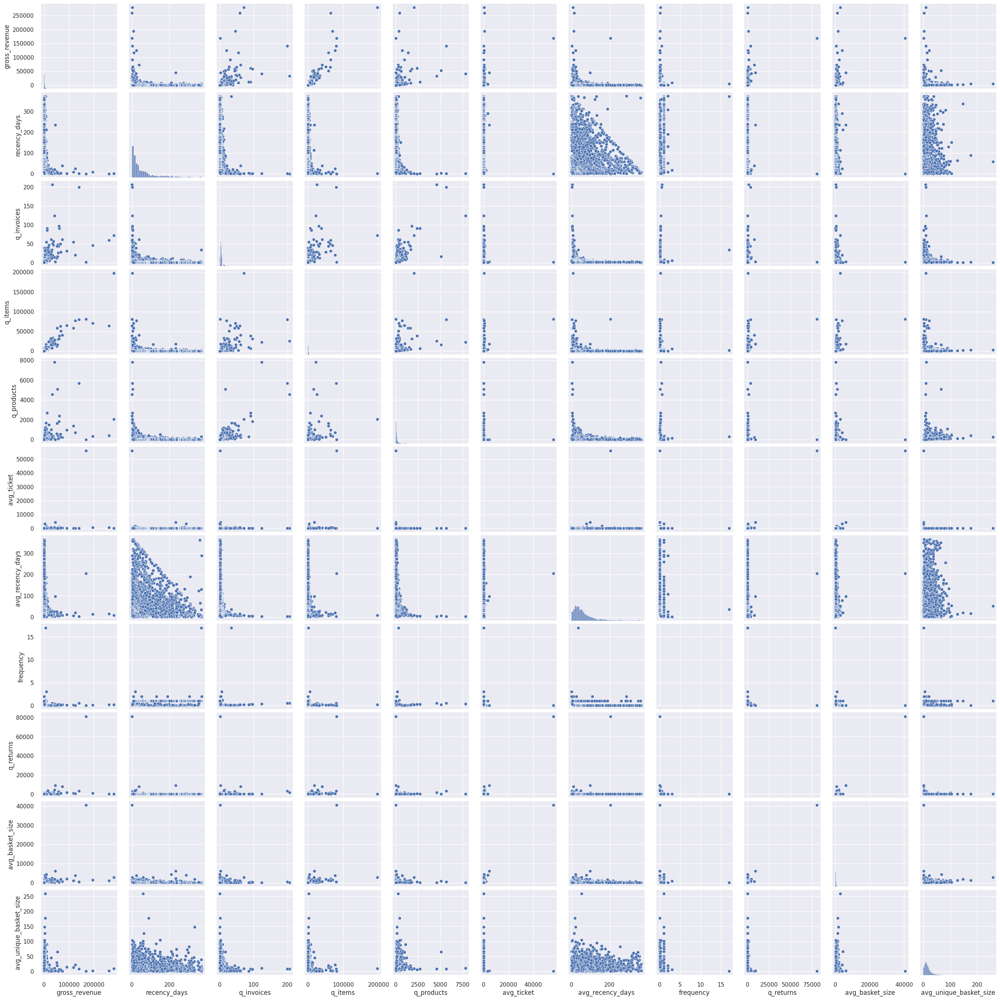

In [41]:
cols = ['customer_id']
df4_2 = df4.drop(cols, axis=1)
plt.figure(figsize=(25, 12));
sns.pairplot(df4_2);

## 5.3. Space Study

In [42]:
df4_3 = df4.drop(columns='customer_id', axis=1).copy()

In [43]:
mm = pp.MinMaxScaler()

df4_3['gross_revenue'] = mm.fit_transform(df4_3[['gross_revenue']]) 
df4_3['recency_days'] = mm.fit_transform(df4_3[['recency_days']]) 
df4_3['q_invoices'] = mm.fit_transform(df4_3[['q_invoices']]) 
df4_3['q_items'] = mm.fit_transform(df4_3[['q_items']]) 
df4_3['q_products'] = mm.fit_transform(df4_3[['q_products']]) 
df4_3['avg_ticket'] = mm.fit_transform(df4_3[['avg_ticket']]) 
df4_3['avg_recency_days'] = mm.fit_transform(df4_3[['avg_recency_days']]) 
df4_3['frequency'] = mm.fit_transform(df4_3[['frequency']]) 
df4_3['q_returns'] = mm.fit_transform(df4_3[['q_returns']]) 
df4_3['avg_basket_size'] = mm.fit_transform(df4_3[['avg_basket_size']]) 
df4_3['avg_unique_basket_size'] = mm.fit_transform(df4_3[['avg_unique_basket_size']])

X = df4_3.copy()

### 5.3.1. PCA

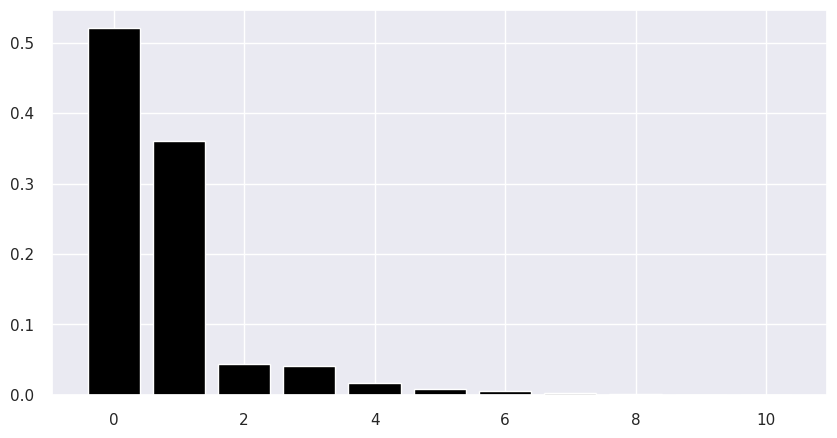

In [50]:
pca = dd.PCA(n_components=X.shape[1])

principal_components = pca.fit_transform(X)

# plot explained variable
features = range(pca.n_components_)

plt.bar(features, pca.explained_variance_ratio_, color='black')

# pca component
df_pca = pd.DataFrame(principal_components)

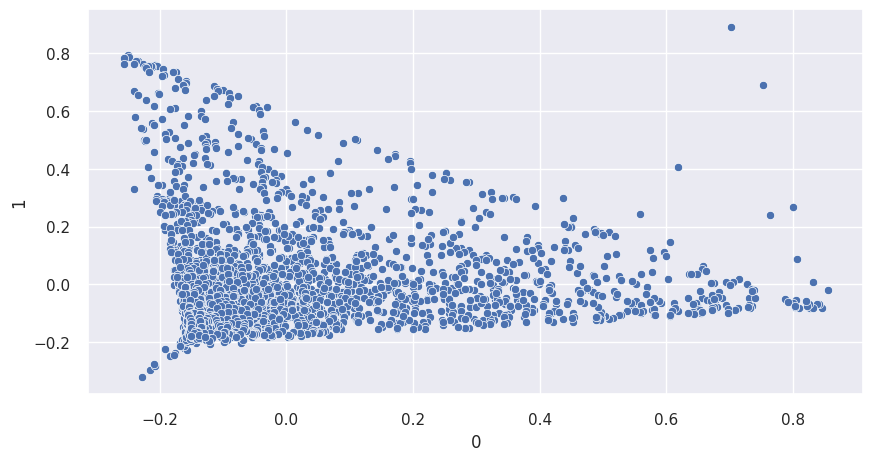

In [52]:
sns.scatterplot(x=0, y=1, data=df_pca);

### 5.3.2. UMAP

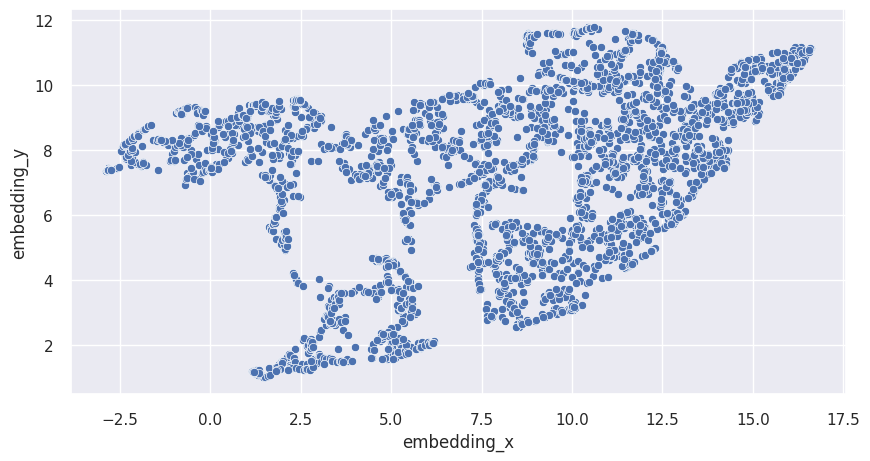

In [53]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(X)

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

sns.scatterplot(x='embedding_x', y='embedding_y', data=df_pca);

### 5.3.3. t-SNE

/home/matheusandrade/anaconda3/envs/loyalty-program/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/matheusandrade/anaconda3/envs/loyalty-program/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



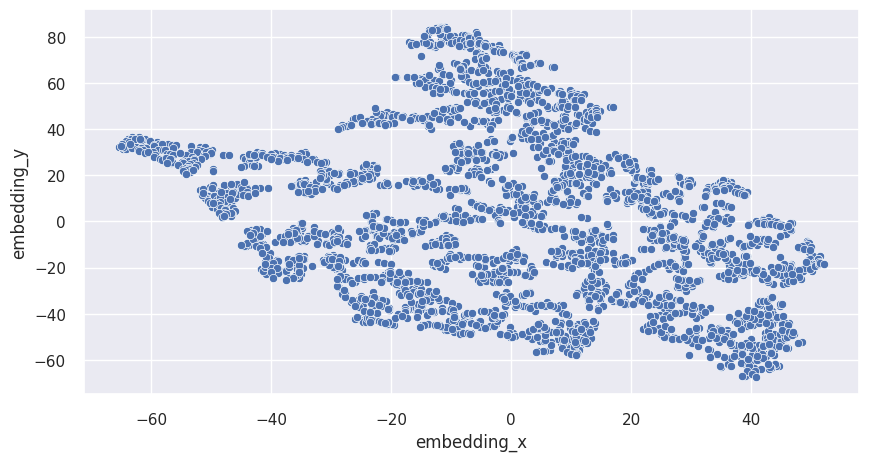

In [56]:
reducer = TSNE(n_components=2, n_jobs=-1, random_state=42)
embedding = reducer.fit_transform(X)

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

sns.scatterplot(x='embedding_x', y='embedding_y', data=df_pca);

### 5.3.4. Tree-Based Embedding

In [75]:
# training dataset
X = df4.drop(columns=['customer_id', 'gross_revenue'], axis=1)
y = df4['gross_revenue']

# model definition
rf_model = en.RandomForestRegressor(n_estimators=100, random_state=42)

# model training
rf_model.fit(X, y)

# dataframe leaf
df_leaf = pd.DataFrame(rf_model.apply(X))

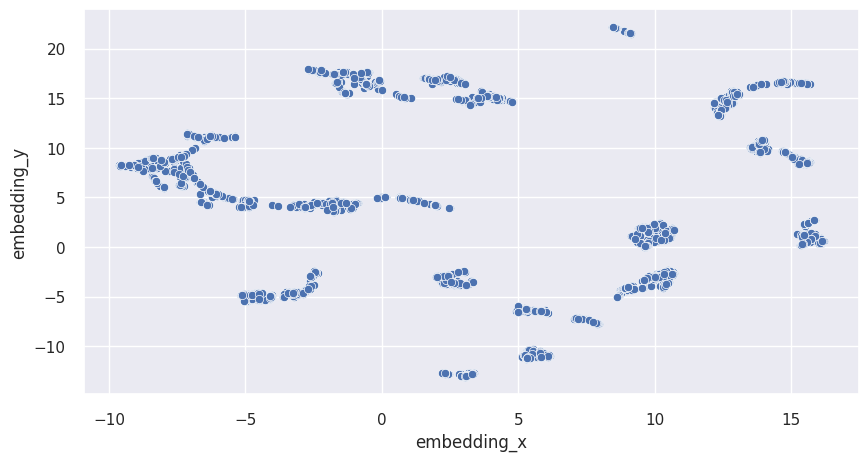

In [78]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(df_leaf)

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

sns.scatterplot(x='embedding_x', y='embedding_y', data=df_pca);

# 6. Data Preparation

In [28]:
df5 = df4.copy()

In [29]:
ss = pp.StandardScaler()

df5['gross_revenue'] = ss.fit_transform(df5[['gross_revenue']])
df5['recency_days'] = ss.fit_transform(df5[['recency_days']])
df5['invoice_no'] = ss.fit_transform(df5[['invoice_no']])
df5['avg_ticket'] = ss.fit_transform(df5[['avg_ticket']])

# 7. Feature Selection

In [30]:
df6 = df5.copy()

# 8. Hyperparameter Fine Tuning

In [31]:
X = df6.drop(columns=['customer_id'])

In [32]:
clusters = [2, 3, 4, 5, 6, 7]

## 8.1. Within Cluster Sum of Square (WSS)

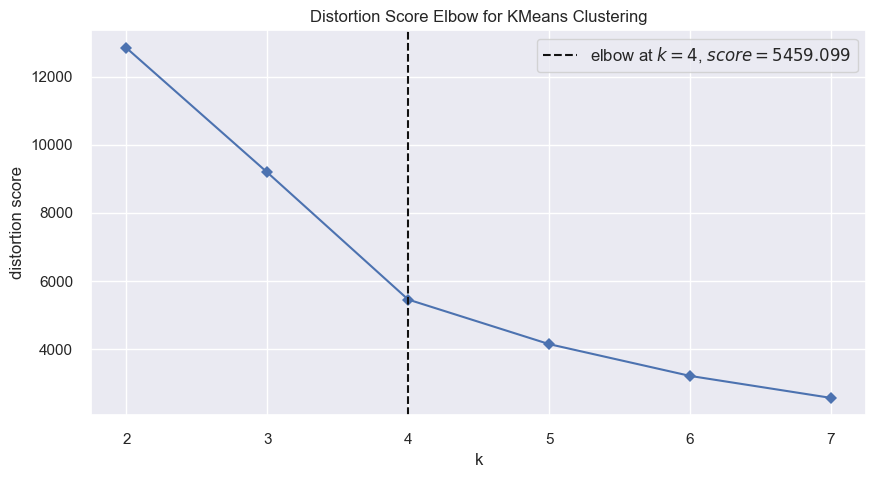

In [33]:
kmeans = KElbowVisualizer(c.KMeans(), k=clusters, timings=False)
kmeans.fit(X)
kmeans.show();

## 8.2. Silhouette Score

In [34]:
kmeans = KElbowVisualizer(c.KMeans(), k=clusters, metric='silhouette', timings=False)
kmeans.fit(X)
kmeans.show();

## 8.3. Silhouette Analysis

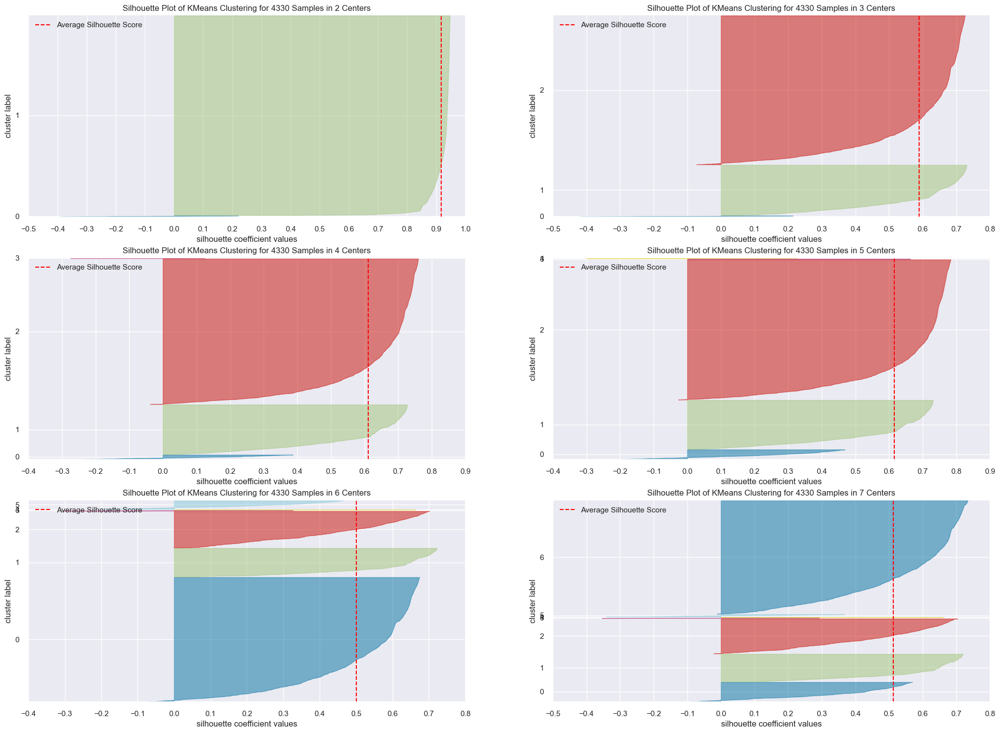

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(25, 18))

for k in clusters:
    km = c.KMeans(n_clusters=k, init='random', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(k, 2)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(X)
    visualizer.finalize()

# 9. Model Training

## 9.1. K-Means

In [ ]:
# model definition
k = 5
kmeans = c.KMeans(init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42)

# model training
kmeans.fit(X)

# clustering
labels = kmeans.labels_

## 9.2. Cluster Validation

In [ ]:
# WSS
print('WSS Value: {}'.format(kmeans.inertia_))

# SS
print('SS Value: {}'.format(metrics.silhouette_score(X, labels, metric='euclidean')))

WSS Value: 4152.047870028395
SS Value: 0.6154548703383368


# 10. Cluster Analysis

In [ ]:
df9 = df6.copy()
df9['cluster'] = labels

## 10.1. Visualization Inspection

c:\Users\pma2022\anaconda3\envs\project\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


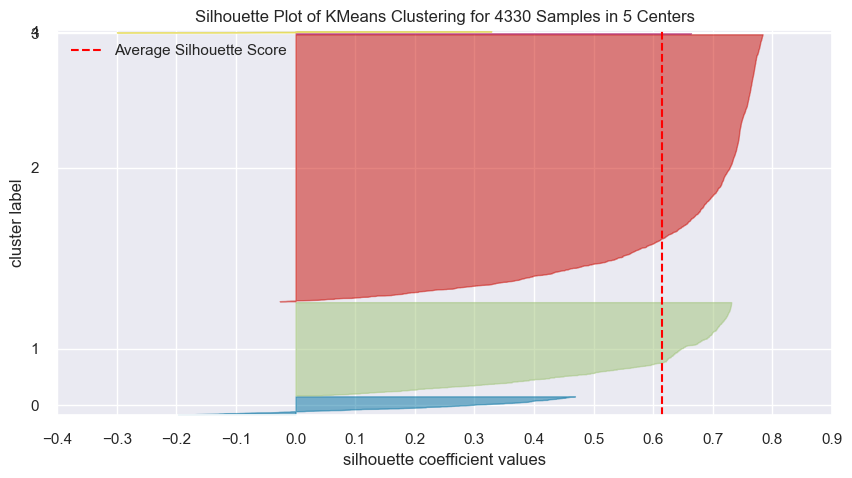

In [ ]:
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(X)
visualizer.finalize()

## 10.2. 2D Plot

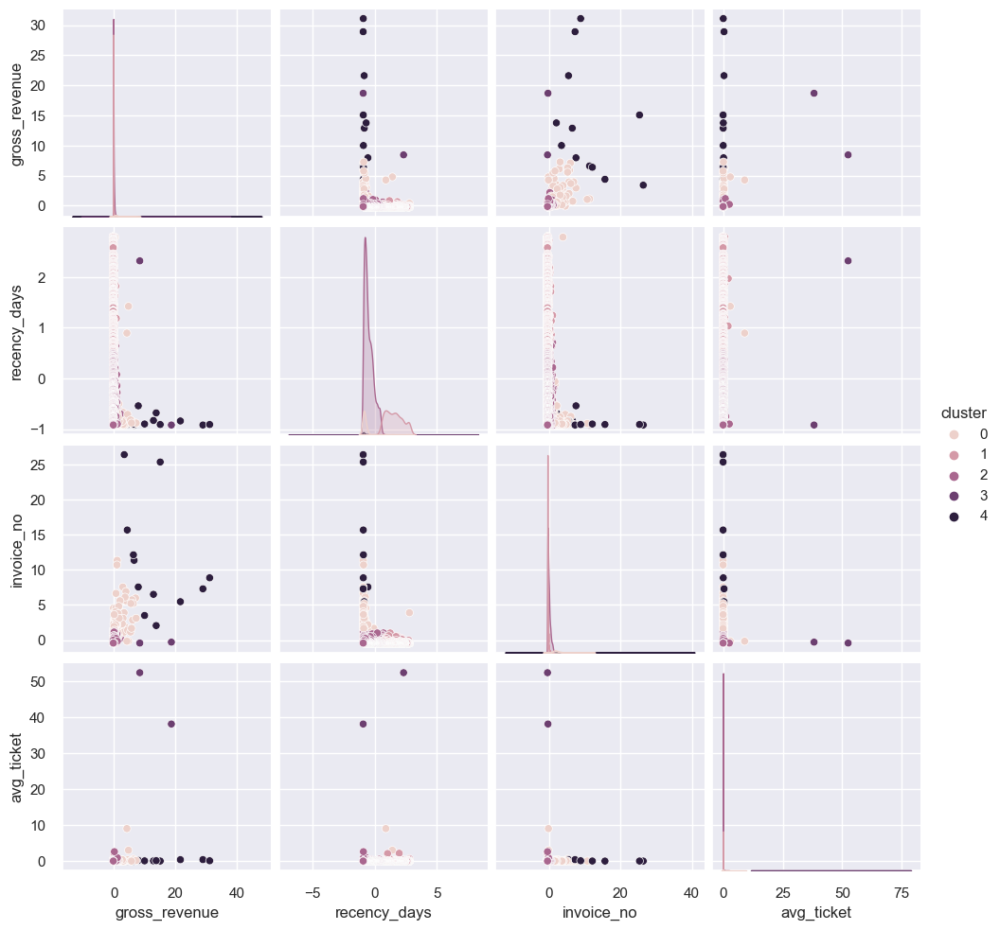

In [ ]:
df_viz = df9.drop(columns='customer_id', axis=1)
sns.pairplot(df_viz, hue='cluster')

## 10.3. UMAP

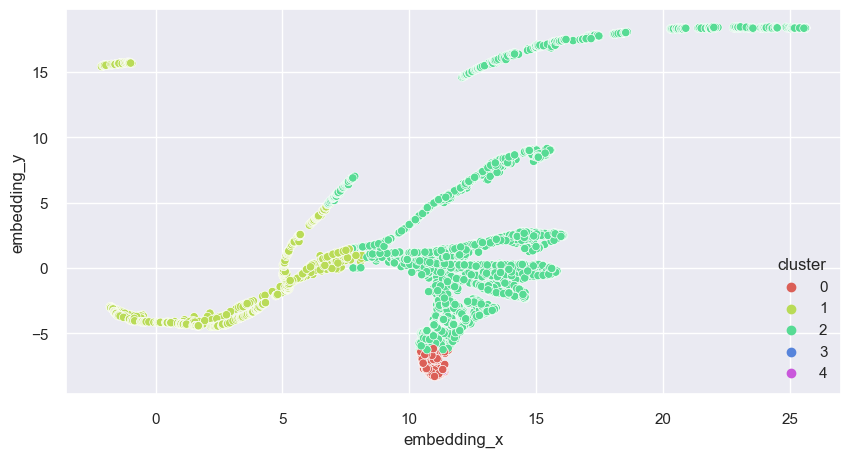

In [ ]:
reducer = umap.UMAP(n_neighbors=90, random_state=42)
embedding = reducer.fit_transform(X)

# embedding
df_viz['embedding_x'] = embedding[:, 0]
df_viz['embedding_y'] = embedding[:, 1]

sns.scatterplot(x='embedding_x', y='embedding_y', hue='cluster', palette=sns.color_palette('hls', n_colors=len(df_viz['cluster'].unique())), data=df_viz);

## 10.2. Cluster Profile

In [ ]:
# number of customers
df_cluster = df9[['customer_id', 'cluster']].groupby('cluster').count().reset_index()
df_cluster['perc_customer'] = 100 * (df_cluster['customer_id'] / df_cluster['customer_id'].sum())

# average gross revenue
df_avg_gross_revenue = df9[['gross_revenue', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_gross_revenue, how='inner', on='cluster')

# average recency days
df_avg_recency_days = df9[['recency_days', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_recency_days, how='inner', on='cluster')

# average invoice number
df_avg_invoice_no = df9[['invoice_no', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_invoice_no, how='inner', on='cluster')

# average ticket
df_ticket = df9[['avg_ticket', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_ticket, how='inner', on='cluster')

df_cluster

,cluster,customer_id,perc_customer,gross_revenue,recency_days,invoice_no,avg_ticket
0,0,208,4.8037,1.1146,-0.7861,2.3417,0.0480
1,1,1064,24.5727,-0.1737,1.5573,-0.3543,-0.0196
2,2,3044,70.3002,-0.0776,-0.4877,-0.0794,-0.0265
3,3,2,0.0462,13.5578,0.7015,-0.3598,45.3300
4,4,12,0.2771,13.4995,-0.8482,11.0141,0.0709


Cluster 1: (Insider)
- Customers: 6 (0.14%)
- Average Recency: 7 days
- Average Invoice Number: 89
- Average Gross Revenue: $ 182.181,98

Cluster 2:
- Customers: 6 (0.71%)
- Average Recency: 14 days
- Average Invoice Number: 53
- Average Gross Revenue: $ 40.543,52

CLuster 3:
- Customers: 6 (99,15%)
- Average Recency: 92 days
- Average Invoice Number: 5
- Average Gross Revenue: $ 1.372,57

# 11. Deployment